In [2]:
import pandas as pd
import ast
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import os
from PIL import Image
import matplotlib.image as mpimg
import numpy as np


In [ ]:

file_path = r"C:\Users\alexa\Thesis\face_aus_emotions_with_confidence.csv"
df = pd.read_csv(file_path)


In [13]:
# Function to compute intensity scores
def compute_intensity(au_dict, AUs):
    print(f"Computing intensity for AUs: {AUs}")
    print(f"AU Dict: {au_dict}")

    intensity = sum(au_dict.get(au, 0) for au in AUs)
    print(f"Computed Intensity: {intensity}")
    return intensity


# Define AU mappings for emotions
emotion_AUs = {
    "Happiness": ["AU06", "AU12"],
    "Surprise": ["AU01", "AU02", "AU05"],
    "Anger": ["AU04", "AU07"],
    "Sadness": ["AU01", "AU04", "AU15"]
}


In [14]:

import json
import numpy as np



# Extract emotion scores
intensity_scores = {"Image Title": [], "Happiness Score": [], "Surprise Score": [], "Anger Score": [], "Sadness Score": []}

for _, row in df.iterrows():
    image_title = row["Image Title"]
    au_data = row["Active AUs"]

    if isinstance(au_data, str):  
        try:
            # Convert malformed numpy floats and single quotes
            au_data = au_data.replace("np.float64(", "").replace(")", "").replace("'", "\"")
            au_dict = json.loads(au_data)  # Convert JSON string to dictionary
            if not isinstance(au_dict, dict):
                raise ValueError("Parsed data is not a dictionary")
        except Exception as e:
            print(f"Error parsing AU data for {image_title}: {e}")
            au_dict = {}  # Use an empty dict to avoid errors
    else:
        au_dict = {}

    scores = {emotion: compute_intensity(au_dict, AUs) for emotion, AUs in emotion_AUs.items()}

    intensity_scores["Image Title"].append(image_title)
    for emotion, score in scores.items():
        intensity_scores[f"{emotion} Score"].append(score)

# Convert to DataFrame
intensity_df = pd.DataFrame(intensity_scores)

# Handle missing values by filling with 0  
intensity_df.fillna(0, inplace=True)  

# Save to CSV
intensity_df.to_csv("processed_emotion_intensity.csv", index=False)

# Show the first few rows to verify
print(intensity_df.head())



Computing intensity for AUs: ['AU06', 'AU12']
AU Dict: {'AU1': 0.4954, 'AU2': 0.4043, 'AU4': 0, 'AU5': 0.9139, 'AU6': 0.3895, 'AU7': 0.9139, 'AU9': 3.0, 'AU10': 0, 'AU12': 0.3895, 'AU14': 0.1398, 'AU15': 0.2097, 'AU17': 0.466, 'AU20': 0.2097, 'AU23': 0.466, 'AU25': 0, 'AU26': 0, 'AU28': 0.466, 'AU45': 0.9139}
Computed Intensity: 0.3895
Computing intensity for AUs: ['AU01', 'AU02', 'AU05']
AU Dict: {'AU1': 0.4954, 'AU2': 0.4043, 'AU4': 0, 'AU5': 0.9139, 'AU6': 0.3895, 'AU7': 0.9139, 'AU9': 3.0, 'AU10': 0, 'AU12': 0.3895, 'AU14': 0.1398, 'AU15': 0.2097, 'AU17': 0.466, 'AU20': 0.2097, 'AU23': 0.466, 'AU25': 0, 'AU26': 0, 'AU28': 0.466, 'AU45': 0.9139}
Computed Intensity: 0
Computing intensity for AUs: ['AU04', 'AU07']
AU Dict: {'AU1': 0.4954, 'AU2': 0.4043, 'AU4': 0, 'AU5': 0.9139, 'AU6': 0.3895, 'AU7': 0.9139, 'AU9': 3.0, 'AU10': 0, 'AU12': 0.3895, 'AU14': 0.1398, 'AU15': 0.2097, 'AU17': 0.466, 'AU20': 0.2097, 'AU23': 0.466, 'AU25': 0, 'AU26': 0, 'AU28': 0.466, 'AU45': 0.9139}
Computed I

In [12]:
print(f"Row: {row}")
print(f"AU Data: {au_dict}")
print(f"Scores: {scores}")


Row: Image Title                                                Dn2IQNvbbrs.jpg
Active AUs               {'AU1': np.float64(0.5379), 'AU2': np.float64(...
Predicted Emotion                                                 Blinking
Confidence Level                                                     0.00%
Left Eye Coordinates     [(309, 263), (320, 265), (333, 267), (346, 271...
Right Eye Coordinates    [(406, 279), (420, 279), (435, 281), (450, 282...
Nose Coordinates         [(369, 271), (367, 293), (363, 315), (360, 337...
Mouth Coordinates        [(325, 370), (338, 370), (351, 370), (362, 376...
Name: 2582, dtype: object
AU Data: {'AU1': 0.5379, 'AU2': 0.465, 'AU4': 0, 'AU5': 1.5259, 'AU6': 0, 'AU7': 1.5259, 'AU9': 0, 'AU10': 0, 'AU12': 0, 'AU14': 0.6393, 'AU15': 0, 'AU17': 0, 'AU20': 0, 'AU23': 0, 'AU25': 0, 'AU26': 0, 'AU28': 0, 'AU45': 1.5259}
Scores: {'Happiness': 0, 'Surprise': 0, 'Anger': 0, 'Sadness': 0}


In [15]:
# Save processed data for further analysis
intensity_df.to_csv(r"C:\Users\alexa\Thesis\processed_emotion_intensity.csv", index=False)

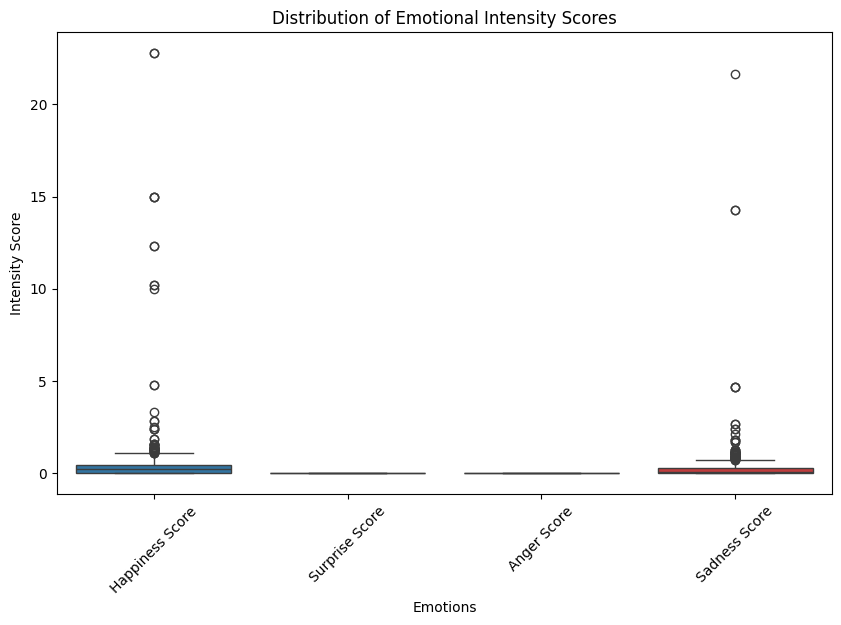

In [16]:
# Visualization of Emotional Intensity Distribution
plt.figure(figsize=(10,6))
sns.boxplot(data=intensity_df.drop(columns=["Image Title"]))
plt.title("Distribution of Emotional Intensity Scores")
plt.ylabel("Intensity Score")
plt.xlabel("Emotions")
plt.xticks(rotation=45)
plt.show()


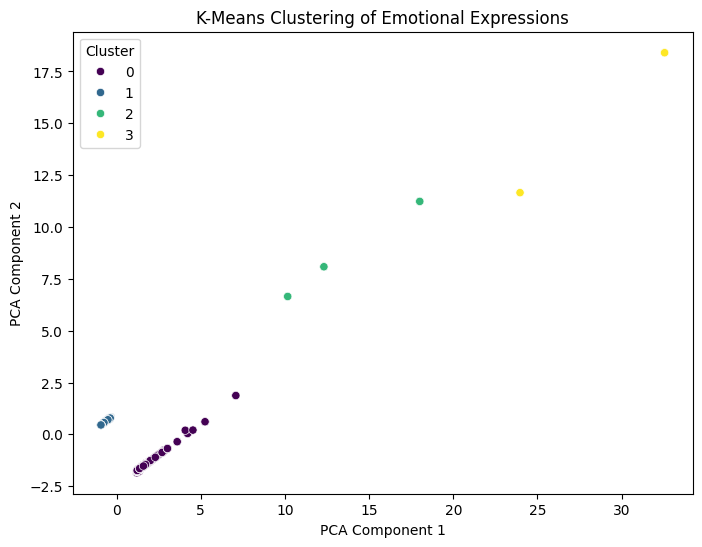

Cluster 0: 383 images


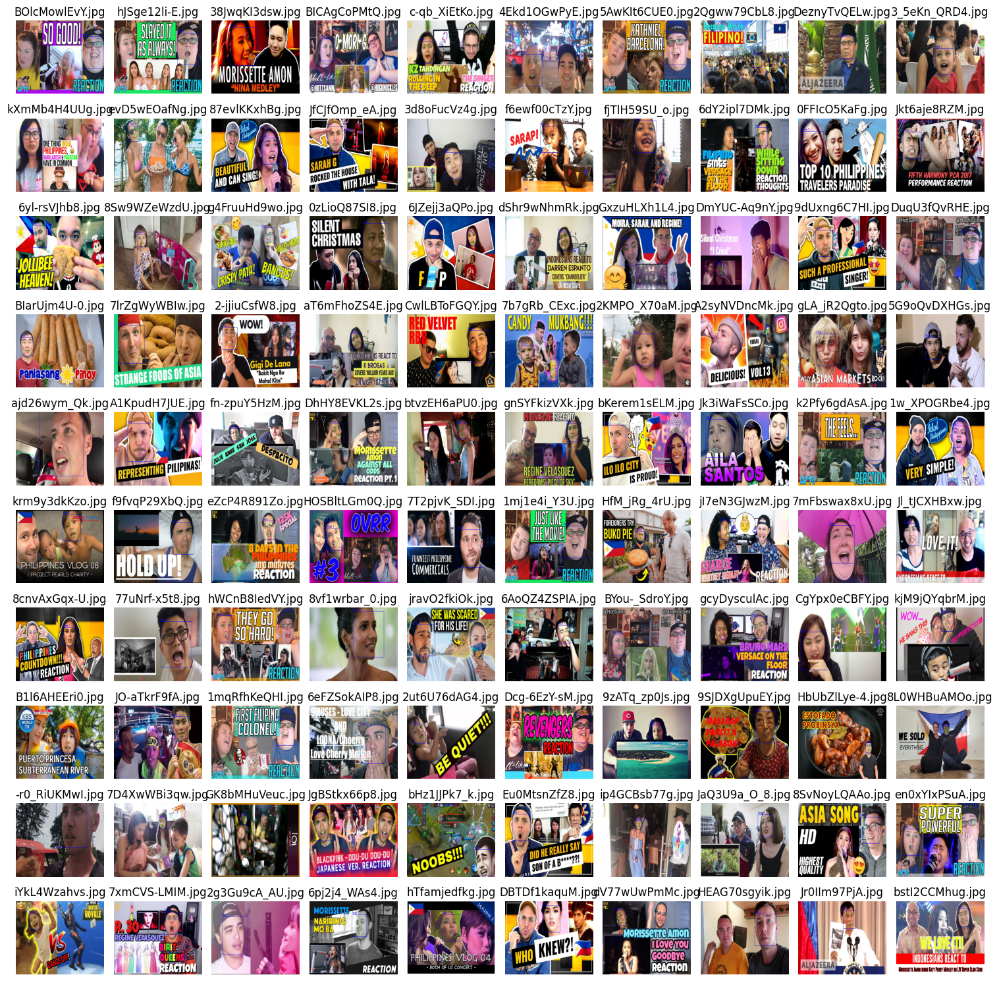

Cluster 1: 1112 images


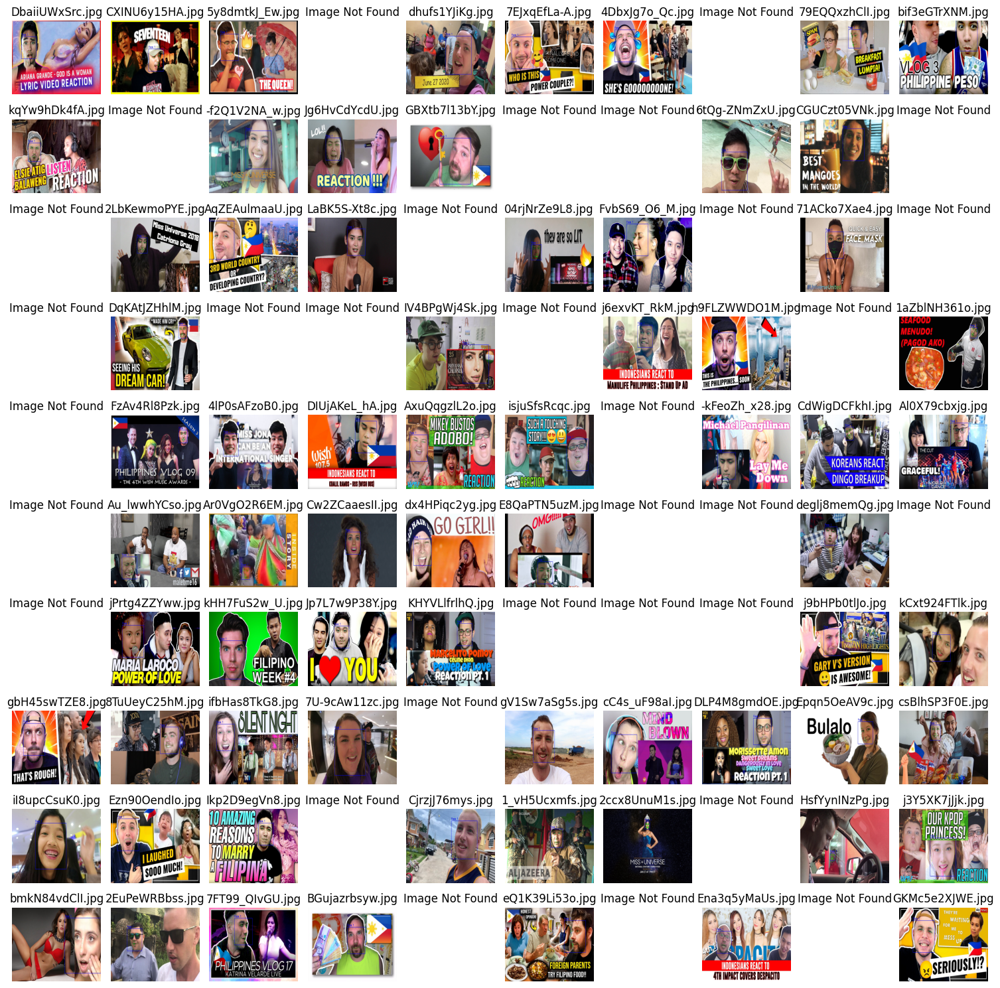

Cluster 2: 3 images


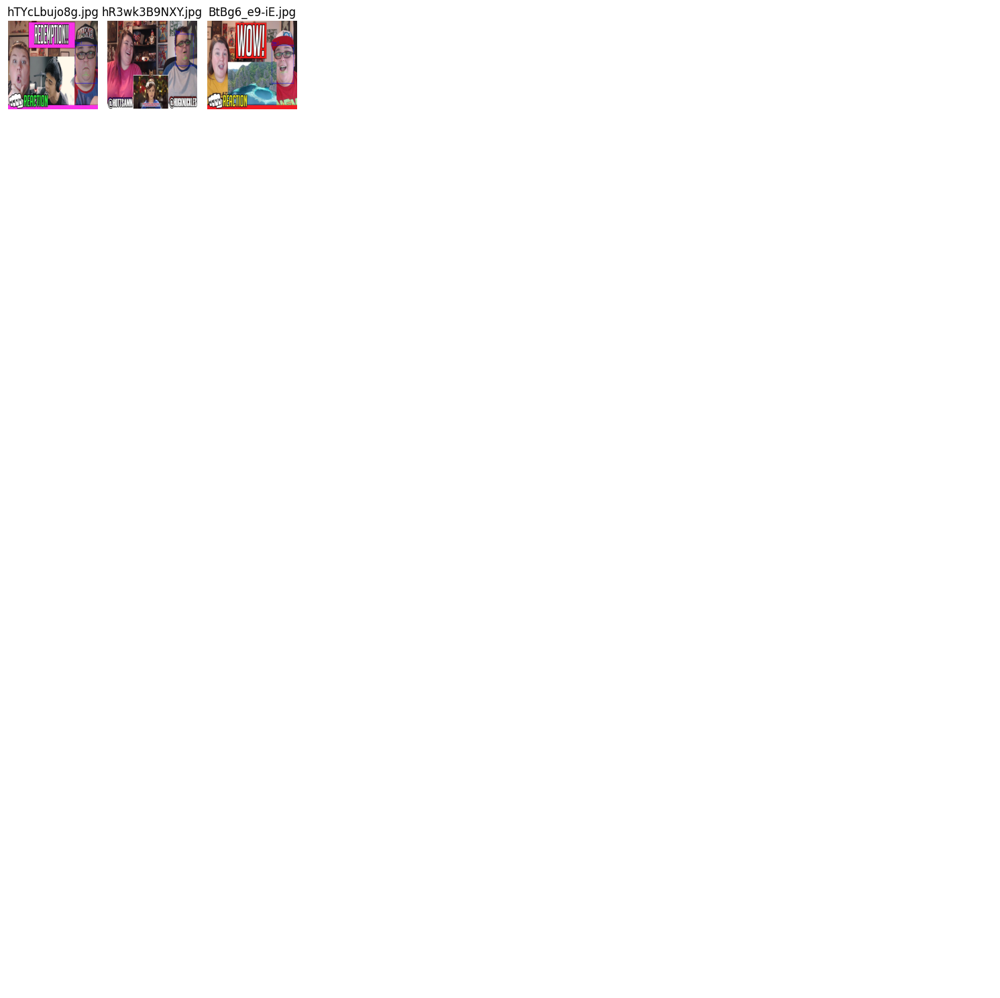

Cluster 3: 2 images


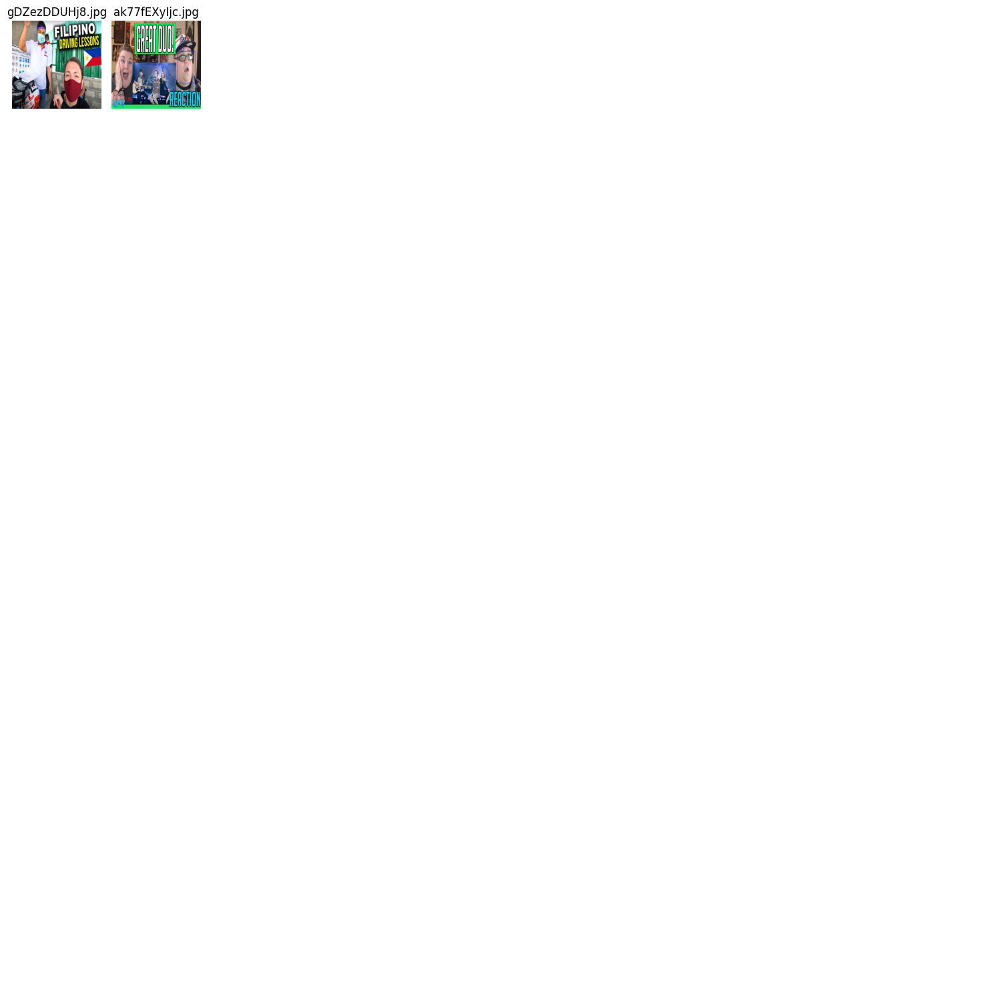

Emotional intensity scores computed, saved, and visualized successfully with clustering and thumbnails.


In [18]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import seaborn as sns

# Apply Clustering (K-Means)
cluster_features = intensity_df.drop(columns=["Image Title"])
if not cluster_features.isnull().values.any() and not cluster_features.empty:
    kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
    intensity_df["Cluster"] = kmeans.fit_predict(cluster_features)
    
    # Reduce Dimensions for Visualization
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(cluster_features)
    intensity_df["PCA1"] = pca_result[:,0]
    intensity_df["PCA2"] = pca_result[:,1]
    
    # Plot Clusters
    plt.figure(figsize=(8,6))
    sns.scatterplot(x=intensity_df["PCA1"], y=intensity_df["PCA2"], hue=intensity_df["Cluster"], palette="viridis")
    plt.title("K-Means Clustering of Emotional Expressions")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.show()
    
    # Display thumbnails for each cluster
    for cluster_id in sorted(intensity_df["Cluster"].unique()):
        cluster_images = intensity_df[intensity_df["Cluster"] == cluster_id]["Image Title"].unique().tolist()
        print(f"Cluster {cluster_id}: {len(cluster_images)} images")
        
        fig, axes = plt.subplots(10, 10, figsize=(15,15))  # Display 100 images (10x10 grid)
        axes = axes.flatten()
        for i, img_title in enumerate(cluster_images[:100]):
            img_path = os.path.join(r"C:\Users\alexa\Thesis\processed_thumbnails", img_title)
            if os.path.exists(img_path):
                img = mpimg.imread(img_path)
                axes[i].imshow(img)
                axes[i].axis('off')
                axes[i].set_title(img_title)  # Use the image title instead of cluster number
                axes[i].set_aspect('auto')
            else:
                axes[i].axis('off')
                axes[i].set_title("Image Not Found")
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')
        plt.tight_layout()
        plt.show()
else:
    print("Clustering could not be performed: empty or invalid data.")

print("Emotional intensity scores computed, saved, and visualized successfully with clustering and thumbnails.")